# Intro to AI 2023
### Week 10. Evolutionary Computation

**Agenda:**
- Traveling salesman problem

**Tasks:**
- fill in the gaps in the code
- feel free to change code as you wish


# The Travelling Salesman Problem

Find the shortest round trip through $n$ cities.

How can you solve these problem?
- exhaustive search
- However, if $P≠NP$, we can not expect any fast algorithm to emerge, ever
- The exhaustive search will let you solve problems up to 15 cities in few days
- Held-Karp algorithm let you solve instances up to 30–50 cities, optimistically
- Christofides Algorithm will give you a solution in a short amount of time that is at most 50% longer than the shortest round trip

### What are the individuals?
### How to mutate?
### Crossover?
![](https://github.com/RufinaMay/CV2019Fall_Pictures/blob/master/crossover1.png?raw=true)

![](https://github.com/RufinaMay/CV2019Fall_Pictures/blob/master/crossover2.png?raw=true)

![](https://github.com/RufinaMay/CV2019Fall_Pictures/blob/master/crossover3.png?raw=true)

### Fitness Score?

![](https://github.com/RufinaMay/CV2019Fall_Pictures/blob/master/traveling_salesman.gif?raw=true)

## Initial data

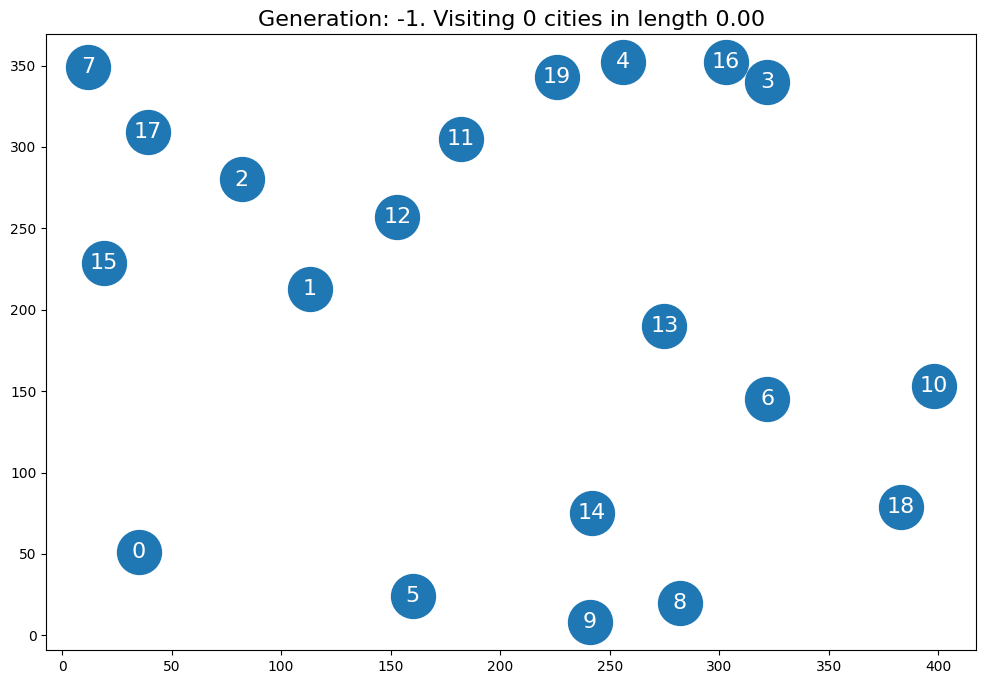

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np


cities = np.array([[35, 51],
                   [113, 213],
                   [82, 280],
                   [322, 340],
                   [256, 352],
                   [160, 24],
                   [322, 145],
                   [12, 349],
                   [282, 20],
                   [241, 8],
                   [398, 153],
                   [182, 305],
                   [153, 257],
                   [275, 190],
                   [242, 75],
                   [19, 229],
                   [303, 352],
                   [39, 309],
                   [383, 79],
                   [226, 343]])

def create_fitness(cities):
  # returns fitness function
  # negative of total diatnce
  matrix = []
  for city in cities:
      row = []
      for city_ in cities:
          row.append(np.linalg.norm(city - city_))
      matrix.append(row)
  distances = np.array(matrix)

  def fitness(individual):

    total_distance = 0
    for i in range(len(individual)):
        total_distance += distances[individual[i], individual[(i + 1) % len(individual)]]

    return -total_distance
  return fitness

def compute_distances(cities):
  # returns matrix with distances between cities
  distances = []
  for from_city in cities:
      row = []
      for to_city in cities:
          row.append(np.linalg.norm(from_city - to_city))
      distances.append(row)
  return np.array(distances)


def route_length(distances, route):
  length = 0
  for i in range(len(route)):
      length += distances[route[i], route[(i + 1) % len(route)]]
  return length

def plot_route(cities, route, distances, generation, show=False):
  # plots cities and route
  length = route_length(distances, route)

  plt.figure(figsize=(12, 8))
  plt.scatter(x=cities[:, 0], y=cities[:, 1], s=1000, zorder=1)
  for i in range(len(cities)):
      plt.text(cities[i][0], cities[i][1], str(i), horizontalalignment='center', verticalalignment='center', size=16, c='white')
  for i in range(len(route)):
      plt.plot([cities[route[i]][0], cities[route[(i + 1) % len(route)]][0]],
                [cities[route[i]][1], cities[route[(i + 1) % len(route)]][1]], 'k', zorder=0)

  plt.title(f'Generation: {generation}. Visiting {len(route)} cities in length {length:.2f}', size=16)

  if show:
    plt.show()

  plt.savefig(f'{generation}.png')
  plt.close()

distances = compute_distances(cities) # distances and cities are defined once
plot_route(cities, route=[], distances=distances, generation=-1, show=True)

## Implementation

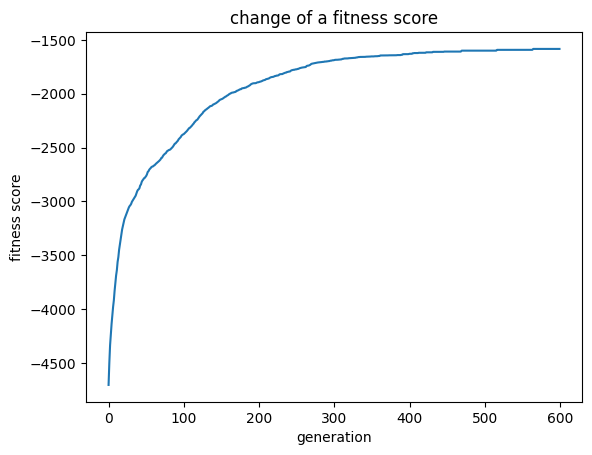

In [16]:
from numpy.random.mtrand import randint
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio
import random
def get_individual(n_cities):
  # returns one individual of a population
  # np.random.choice might help again
  arr = np.arange(n_cities)
  # lit = [np.shuffle(arr) for _ in range(n_cities)]
  # return lit
  np.random.shuffle(arr)
  return arr
  ############################################################################

def initial_population(n_cities, population_size, fitness):
  population = [get_individual(n_cities) for _ in range(population_size)]
  population.sort(key=lambda x: fitness(x))
  return population

def get_parents(population, n_offsprings):
  # here we take the most fit parents for crossover
  mothers = population[-2 * n_offsprings::2]
  fathers = population[-2 * n_offsprings + 1::2]

  return mothers, fathers

def cross(mother, father):
  dic1 = {}
  for index,element in enumerate(mother):
      dic1.update({element:index})
  dic2 = {}
  for index,element in enumerate(father):
      dic2.update({element:index})

  child1 = mother.copy()
  child2 = father.copy()

  crossover_point = random.randint(0,int((len(mother)-1)/2))

  for i in range(crossover_point+1):
      child1[i], child1[dic1[father[i]]] = child1[dic1[father[i]]], child1[i]
  for i in range(crossover_point+1):
      child2[i], child2[dic2[mother[i]]] = child2[dic2[mother[i]]], child2[i]
  #ADD A MAPING TO THE INDEXES and then fo the procedure described in the article
    #replace "pass" with "return"
  return child1, child2
  ############################################################################

def mutate(offspring):

  ###################### put you code here ###################################
  ind = np.arange(len(offspring))
  np.random.shuffle(ind)
  offspring[ind[0]],offspring[ind[1]]=offspring[ind[1]],offspring[ind[0]]

  return offspring #replace "pass" with "return"
  ############################################################################

def replace_population(population, new_individuals, fitness):
  # replace least fit individuals with better ones

  ###################### put you code here ###################################

  final = population + new_individuals
  final.sort(key=lambda x: fitness(x), reverse=True)
  final = final[:len(population)]
  return final #replace "pass" with "return"
  ############################################################################

def evolution_step(population, population_size, fitness, n_offsprings):
  mothers, fathers = get_parents(population, n_offsprings)
  offsprings = []

  for mother, father in zip(mothers, fathers):
      child1, child2 = cross(mother, father)
      offspring = mutate(child1)
      offspring = mutate(child2)
      offsprings.append(offspring)

  new_population = replace_population(population, offsprings, fitness)
  return new_population


def evolution(n_cities, fitness, population_size=100, n_offsprings=30, generations=10):
  fitness_change = []
  population = initial_population(n_cities, population_size, fitness)

  for generation in range(generations):
    population = evolution_step(population, population_size, fitness, n_offsprings)
    best_individual = population[-1]
    fitness_change.append(fitness(best_individual))
    plot_route(cities, route=best_individual, distances=distances, generation=generation)

  return fitness_change

generations=600
fitness_change = evolution(len(cities), create_fitness(cities), population_size=120, n_offsprings=70, generations=generations)


plt.plot(fitness_change)
plt.title('change of a fitness score')
plt.xlabel('generation')
plt.ylabel('fitness score')
plt.show()

<ipython-input-17-110c5230d025>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f'{generation}.png')


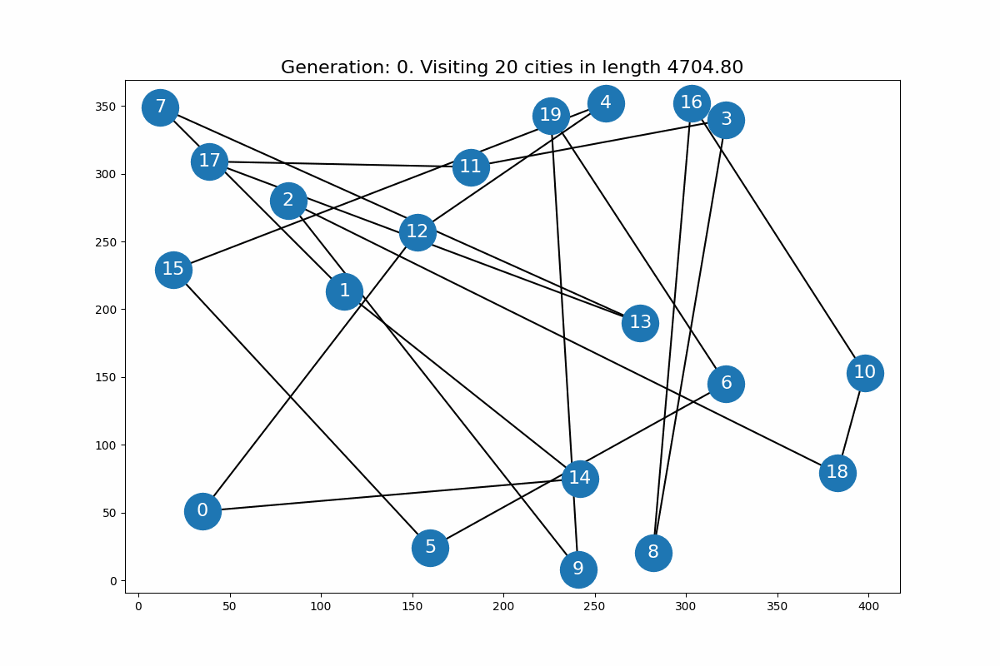

In [17]:
from IPython.display import Image

with imageio.get_writer('mygif.gif', mode='I') as writer:
    for generation in range(generations):
        image = imageio.imread(f'{generation}.png')
        writer.append_data(image)

Image(open('mygif.gif','rb').read())

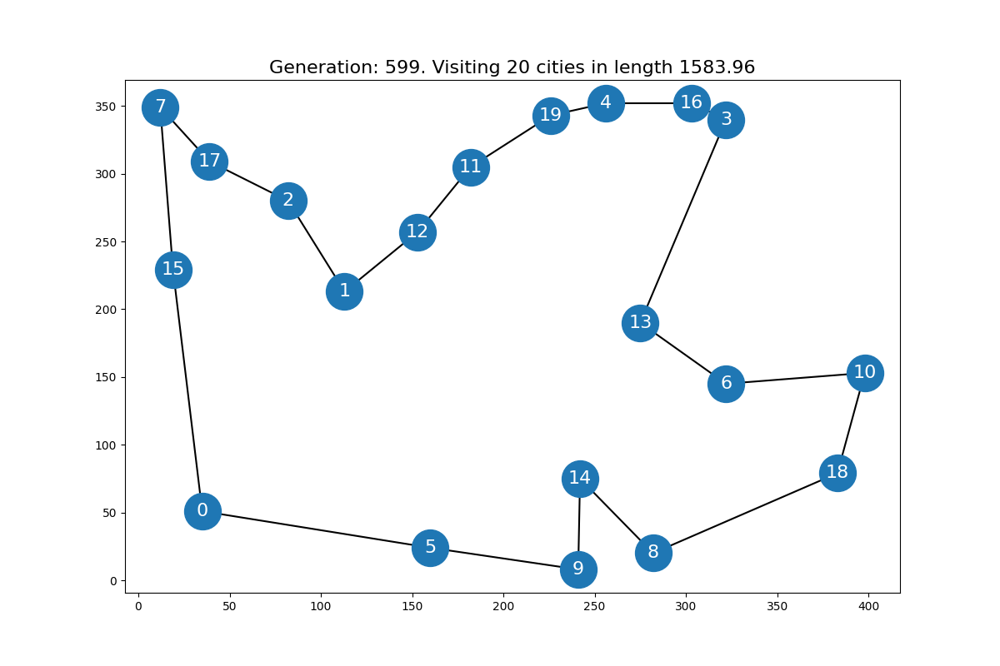

In [18]:
Image(open(f'{generations-1}.png','rb').read())